###was manually extracting phylogeny information from NCBI website, realized there's gotta be a better way since I already have a list of accession numbers

In [37]:
from Bio import Entrez
from Bio import SeqIO

In [32]:
gi_list=open("./akmk_terminases/terminases-shorty-for-JB.txt")
gis=[]
for line in gi_list.readlines()[1:]:
    gis.append(line.split("\t")[3])
print(len(gis))
print(gis[0:3])

199
['3337256', '9634649', '156564098']


In [47]:
Entrez.email="julia.brown@einstein.yu.edu"
gi_str = ",".join(gis)
handle=Entrez.efetch(db="protein", id=gi_str, rettype="gb",retmode="text")
records=list(SeqIO.parse(handle, "gb"))

In [59]:
first_record=records[1]
print(first_record.annotations["taxonomy"][3])
print(first_record.id)

Siphoviridae
NP_038323.1


In [70]:
taxdict={}

for record in records:
    virtax=record.annotations["taxonomy"]
    if virtax[0]=="Viruses":
        if len(virtax)>3:
            virtype=virtax[3]
        else:
            virtype=virtax[-1]
    else:
        virtype="prophage"

    virID=record.id
    
    taxdict[virID]=virtype

In [90]:
terminfo=open("../ImportantInfo/Terminase_Info.txt")
termdict1={}
termdict2={}

term=terminfo.read().split("\r")
for t in term[1:]:
    vec=t.split("\t")
    termdict1[vec[1]]=vec[2]
    termdict2[vec[1]]=vec[4]

In [100]:
gi_list=open("./akmk_terminases/terminases-shorty-for-JB.txt")
out=open("./akmk_terminases/terminases-shorty-for-JB_info_added.txt","w")

for line in gi_list.readlines()[1:]:
    line=line.replace("\n","")

    vec=line.split("\t")
    
    tax=taxdict[vec[2]]
    short=vec[0]
    termcode=termdict1.get(short,"not characterized")
    termshort=termdict2.get(short, "not characterized")
    addon=[tax, termcode, termshort]

    
    added=vec+addon

    out.write("\t".join(added)+"\n")
out.close()
!open ./akmk_terminases/terminases-shorty-for-JB_info_added.txt -a textedit

In [2]:
%load_ext rpy2.ipython

In [34]:
%%R
library(rwantshue)
library(magrittr)
library(plyr);library(dplyr)
library(ggplot2)
library(RCurl)
library(ape)

In [4]:
%%R
info<-read.table("./akmk_terminases/terminases-shorty-for-JB_info_added.txt", sep="\t")
head(info)

           V1                         V2             V3        V4
1         186   Enterobacteria phage 186     AAC34148.1   3337256
2        7201   Streptococcus phage 7201    NP_038323.1   9634649
3 0305phi8-36 Bacillus phage 0305phi8-36 YP_001429607.1 156564098
4  1102phi1-3  Bacillus phage 1102phi1-3     AAS45252.1  42742386
5        933W  Enterobacteria phage 933W    NP_049511.1   9632517
6          9g    Enterobacteria phage 9g YP_009032373.1 640885123
                                  V5           V6                V7
1                 terminase subunit    Myoviridae not characterized
2                             ORF22  Siphoviridae        3-cos/HK97
3           terminase large subunit    Myoviridae not characterized
4                   large terminase    Myoviridae not characterized
5  putative large subunit terminase   Podoviridae      headful/933W
6           terminase large subunit  Siphoviridae not characterized
                 V8
1 not characterized
2               Cos
3 

In [5]:
%%R



cats<-info$V6%>%unique
N<-cats%>%length
scheme<-iwanthue()
colors=scheme$hex(N, color_space=hcl_presets$intense)
cols<-data.frame(colors=colors, cat=cats)
info$tax_col<-cols$colors[match(info$V6, cols$cat)]

cats<-info$V7%>%unique
N<-cats%>%length
scheme<-iwanthue()
colors=scheme$hex(N, color_space=hcl_presets$intense)
cols<-data.frame(colors=colors, cat=cats)
info$term_col<-cols$colors[match(info$V7, cols$cat)]

cats<-info$V8%>%unique
N<-cats%>%length
scheme<-iwanthue()
colors=scheme$hex(N, color_space=hcl_presets$intense)
cols<-data.frame(colors=colors, cat=cats)
info$term_basic_col<-cols$colors[match(info$V8, cols$cat)]



In [6]:
%%R
colnames(info)[1:8]<-c("short","long","Acc","gbid","desc","tax","term_long","term_short")
info$range<-"range"
str(info)

'data.frame':	199 obs. of  12 variables:
 $ short         : Factor w/ 199 levels "0305phi8-36",..: 3 4 1 2 5 6 7 185 8 9 ...
 $ long          : Factor w/ 189 levels "Achromobacter phage JWAlpha",..: 31 159 5 6 32 33 129 3 99 83 ...
 $ Acc           : Factor w/ 199 levels "AAA32340.1","AAA74327.1",..: 5 60 148 21 73 184 187 12 97 110 ...
 $ gbid          : int  3337256 9634649 156564098 42742386 9632517 640885123 712913967 159139855 16798785 22296524 ...
 $ desc          : Factor w/ 116 levels " bacteriophage DNA packaging protein; terminase, large subunit ",..: 103 62 99 50 77 99 53 51 86 78 ...
 $ tax           : Factor w/ 6 levels "Caudovirales",..: 2 5 2 2 3 5 5 4 5 5 ...
 $ term_long     : Factor w/ 13 levels "3-cos/HK97","5-cos/P2",..: 12 1 12 12 5 12 12 12 7 12 ...
 $ term_short    : Factor w/ 6 levels "Cos","DTR","Headful",..: 6 1 6 6 3 6 6 6 3 6 ...
 $ tax_col       : Factor w/ 6 levels "#568593","#709641",..: 6 2 6 6 5 2 2 1 2 2 ...
 $ term_col      : Factor w/ 13 levels "#455

In [119]:
%%R
write.table(info[,c(1,12,9,6)],file="taxa_def.txt",row.names=FALSE, col.names=FALSE, sep="\t",quote=FALSE)

In [7]:
%%R
write.table(info[,c(1,12,10,7)],file="./no_nahant/term_def.txt",row.names=FALSE, col.names=FALSE, sep="\t",quote=FALSE)

Terminase Tree with Phage Phylogeny mapped

In [120]:
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'term_short_nahant_term.40.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "taxa_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=12998781854590714399312590&restore_saved=1


In [123]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("test.png")

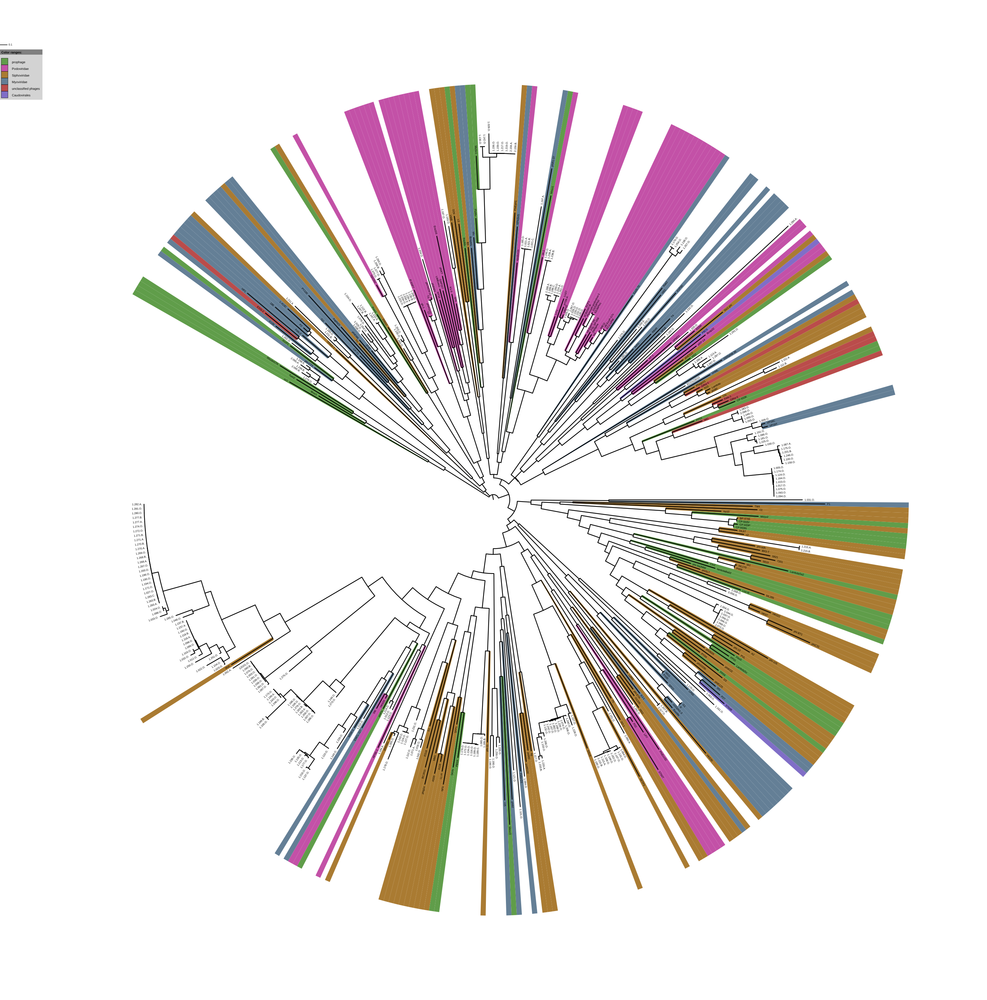

In [124]:
Image("test.png",width=600)

Looks like phage phylogeny does not follow terminase identity.

###I'd like to make a tree of just the Casjens terminases to compare it to what we're seeing here.

In [127]:
mkdir no_nahant

In [2]:
from skbio.alignment import Alignment
from skbio.sequence import DNA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

In [129]:
ls ./akmk_terminases/

TERMINASES-ncbiACCs-KKv080615.ncbiBatchEntrez.fasta
TERMINASES-ncbiACCs-KKv080615.ncbiBatchEntrez.fasta.fai
TERMINASES-ncbiACCs-KKv080615.ncbiBatchEntrez.out.fasta
TERMINASES-ncbiACCs-KKv080615.txt
akmk_terminases_short_title.fasta
akmk_terminases_short_title.fasta.fai
terminases-shorty-for-JB.txt
terminases-shorty-for-JB.xlsx
terminases-shorty-for-JB_info_added.txt
~$terminases-shorty-for-JB.xlsx


In [130]:
!muscle -in akmk_terminases/akmk_terminases_short_title.fasta -out ./no_nahant/casjens_terminases.aln.fasta


MUSCLE v3.8.31 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

akmk_terminases_short_title 199 seqs, max length 889, avg  length 550
00:00:00      2 MB(0%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00      2 MB(0%)  Iter   1  100.00%  K-mer dist pass 2
00:00:02     87 MB(1%)  Iter   1  100.00%  Align node
00:00:02     87 MB(1%)  Iter   1  100.00%  Root alignment
00:00:04     89 MB(1%)  Iter   2  100.00%  Refine tree
00:00:04     89 MB(1%)  Iter   2  100.00%  Root alignment
00:00:04     89 MB(1%)  Iter   2  100.00%  Root alignment
00:00:29     89 MB(1%)  Iter   3  100.00%  Refine biparts
00:00:48     89 MB(1%)  Iter   4  100.00%  Refine biparts
00:01:06     89 MB(1%)  Iter   5  100.00%  Refine biparts
00:01:24     89 MB(1%)  Iter   6  100.00%  Refine biparts
00:01:41     89 MB(1%)  Iter   7  100.00%  Refine biparts
00:01:59     89 MB(1%)  Iter   8  100.00%  Refine biparts


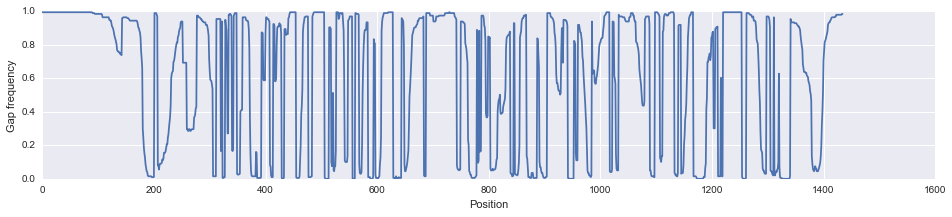

In [134]:
aln=Alignment.read(file="./no_nahant/casjens_terminases.aln.fasta", format="fasta")
gap_freq=[d["-"] for d in aln.position_frequencies()]
fig, ax = plt.subplots()
fig.set_size_inches([16,3])
ax.plot(np.arange(len(gap_freq)), gap_freq)
ax.set_xlabel("Position")
ax.set_ylabel("Gap frequency")

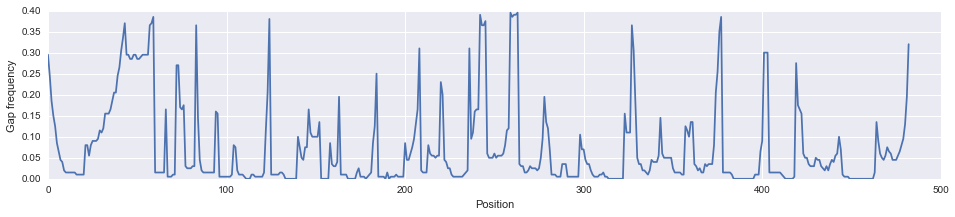

In [136]:
keepers, = np.where(np.array(gap_freq)<=0.40)
aln_masked = aln.subalignment(positions_to_keep=keepers)

gap_freq2=[d["-"] for d in aln_masked.position_frequencies()]

fig, ax = plt.subplots()
fig.set_size_inches([16,3])
ax.plot(np.arange(len(gap_freq2)), gap_freq2)
ax.set_xlabel("Position")
ax.set_ylabel("Gap frequency")

In [137]:
aln_masked.write("./no_nahant/casjens_terminases.aln.masked.fasta", format="fasta")

'./no_nahant/casjens_terminases.aln.masked.fasta'

In [138]:
%%bash
fasttree <./no_nahant/casjens_terminases.aln.masked.fasta > ./no_nahant/casjens_terminases.aln.masked.tree

FastTree Version 2.1.8 No SSE3
Alignment: standard input
Amino acid distances: BLOSUM45 Joins: balanced Support: SH-like 1000
Search: Normal +NNI +SPR (2 rounds range 10) +ML-NNI opt-each=1
TopHits: 1.00*sqrtN close=default refresh=0.80
ML Model: Jones-Taylor-Thorton, CAT approximation with 20 rate categories
Ignored unknown character X (seen 6 times)
Initial topology in 0.20 seconds
Refining topology: 31 rounds ME-NNIs, 2 rounds ME-SPRs, 15 rounds ML-NNIs
      0.19 seconds: ME NNI round 1 of 31, 1 of 196 splits
      0.45 seconds: SPR round   1 of   2, 101 of 394 nodes
      0.65 seconds: SPR round   1 of   2, 201 of 394 nodes
      0.86 seconds: SPR round   1 of   2, 301 of 394 nodes
      1.05 seconds: ME NNI round 11 of 31, 1 of 196 splits
      1.25 seconds: SPR round   2 of   2, 101 of 394 nodes
      1.46 seconds: SPR round   2 of   2, 201 of 394 nodes
      1.68 seconds: SPR round   2 of   2, 301 of 394 nodes
      1.87 seconds: ME NNI round 21 of 31, 1 of 196 splits
Total bra

In [4]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', './no_nahant/casjens_terminases.aln.masked_.40_gaps.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "taxa_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=129981071284611614401675820&restore_saved=1


In [140]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("./no_nahant/tree1.png")

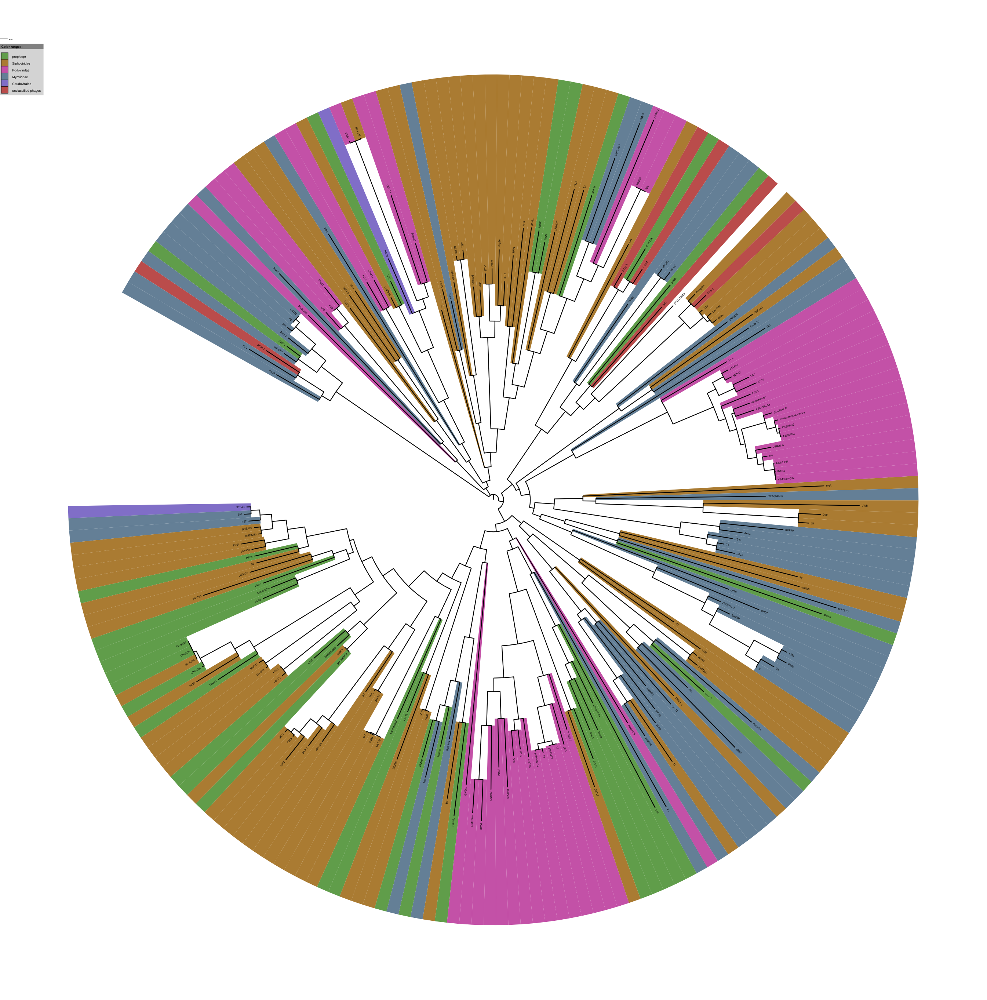

In [141]:
Image("./no_nahant/tree1.png", width=600)

In [14]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', './no_nahant/casjens_terminases.aln.masked.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "./no_nahant/term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=1299878234129414399943030&restore_saved=1


In [15]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("./no_nahant/tree_term_col.png")

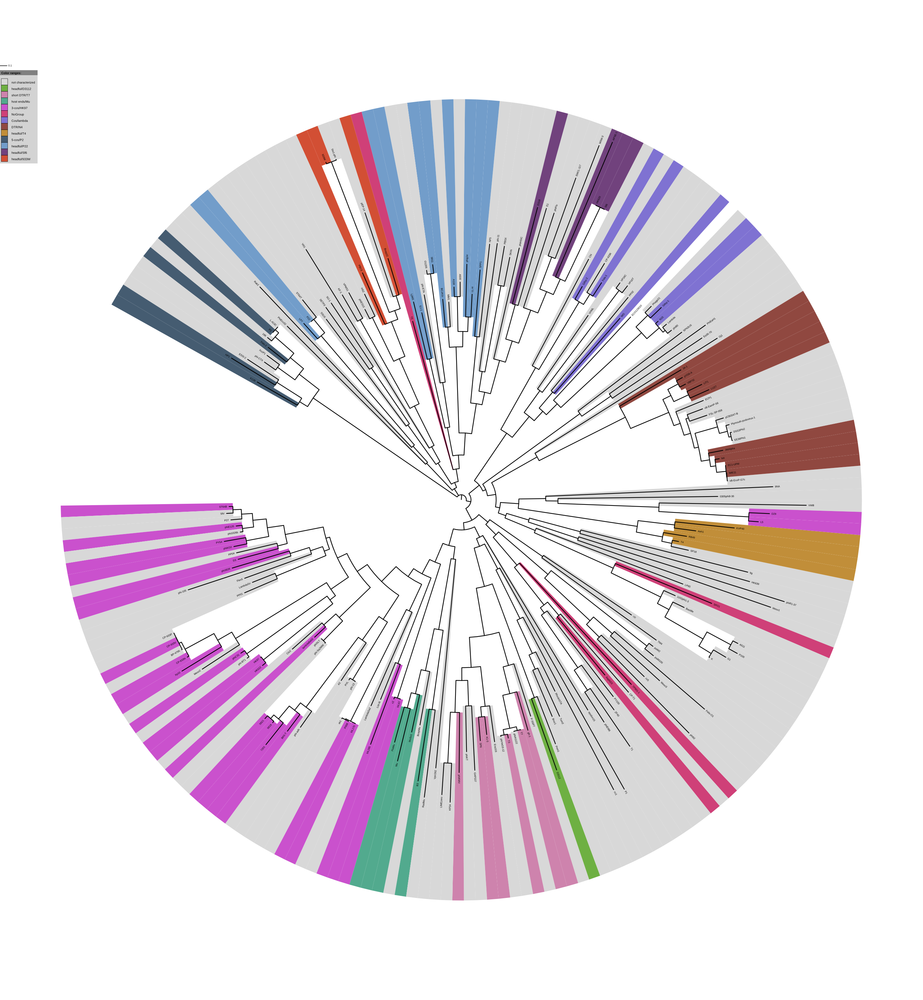

In [16]:
Image("./no_nahant/tree_term_col.png",width="600")

In [17]:
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'term_short_nahant_term.40.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'another tree')
itol_uploader.add_variable("colorDefinitionFile", "./no_nahant/term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=1299878234568614399951760&restore_saved=1


In [18]:
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'term_short_nahant_term.40.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'another tree')
itol_uploader.add_variable("colorDefinitionFile", "./nahant_only/simple_coverage_cols_defs.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=1299878234882214400057720&restore_saved=1


In [19]:
!cat ./no_nahant/term_def.txt ./nahant_only/simple_coverage_cols_defs.txt > combined_term_cov_defs.txt

In [25]:
nahant_list=open("../ImportantInfo/phage_by_group.txt")
out=open("nahant_col.txt","w")
for name in nahant_list.readlines():
    out.write(name.split("\t")[0]+"\t#000000\n")
out.close()
!open nahant_col.txt -a textedit

In [40]:
%%R
input<-read.table("../ImportantInfo/phage_by_group.txt", sep="\t")

cats<-input$V2%>%unique
N<-cats%>%length
scheme<-iwanthue()
colors=scheme$hex(N, color_space=hcl_presets$intense)
cols<-data.frame(colors=colors, cat=cats)
input$color<-cols$colors[match(input$V2, cols$cat)]

write.table(input[,c(1,3)], file="prelim_grp_cols.txt", sep="\t", row.names=FALSE, col.names=FALSE, quote=FALSE)

input$range<-"range"

write.table(input[,c(1,4,3,2)], file="prelim_grp_def.txt", sep="\t", row.names=FALSE, col.names=FALSE, quote=FALSE)

In [45]:
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'term_short_nahant_term.40.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'another tree')
itol_uploader.add_variable("colorDefinitionFile", "combined_term_cov_defs.txt")

itol_uploader.add_variable("dataset2File","nahant_col.txt")
itol_uploader.add_variable("dataset2Type","colorstrip")
itol_uploader.add_variable("dataset2StripWidth","100")
itol_uploader.add_variable("dataset2Label","Nahant")
itol_uploader.add_variable("dataset2Separator","tab")

itol_uploader.add_variable("dataset4File","prelim_grp_cols.txt")
itol_uploader.add_variable("dataset4Type","colorstrip")
itol_uploader.add_variable("dataset4StripWidth","200")
itol_uploader.add_variable("dataset4Label","Preliminary Genome Cluster")
itol_uploader.add_variable("dataset4Separator","tab")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=12998107128939814400176170&restore_saved=1


In [29]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("term_big_tree_term_cov.png")

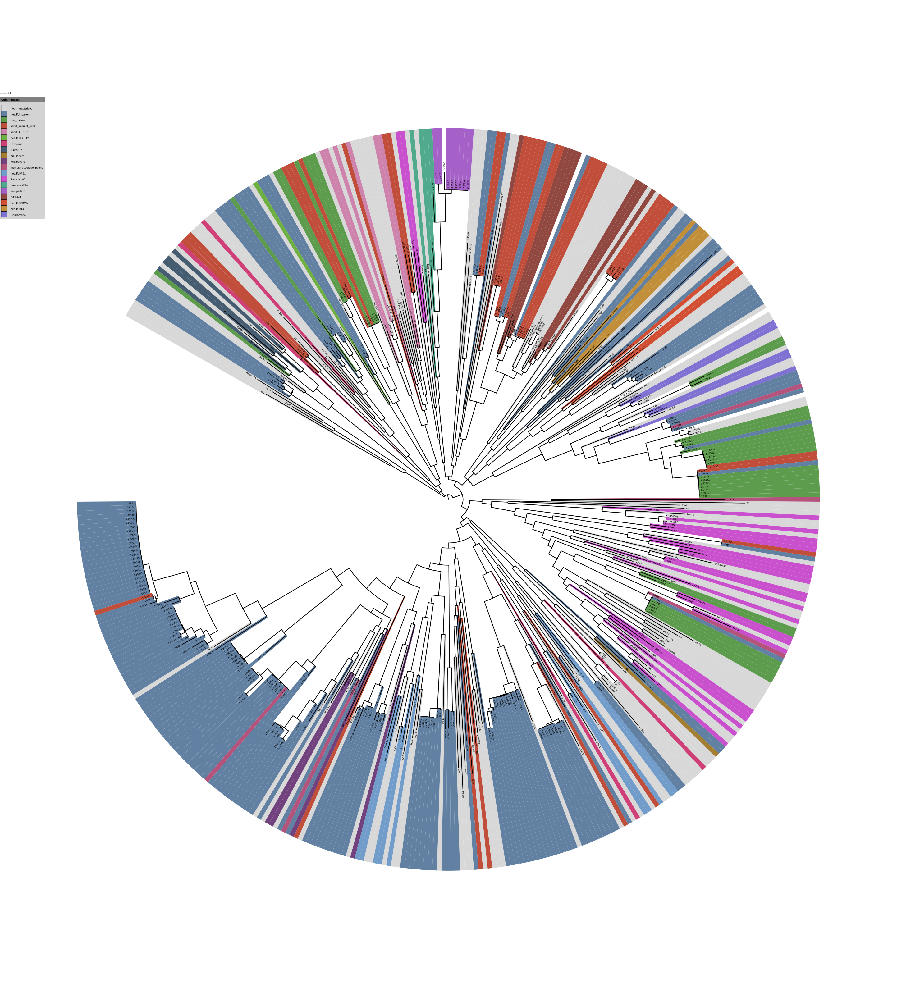

In [30]:
Image("term_big_tree_term_cov.png", width=600)

In [41]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'term_short_nahant_term.40.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'another tree')
itol_uploader.add_variable("colorDefinitionFile", "prelim_grp_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=1299878233053714400118660&restore_saved=1
